In [1]:
from object_detection_fastai.helper.object_detection_helper import *
from object_detection_fastai.loss.RetinaNetFocalLoss import RetinaNetFocalLoss
from object_detection_fastai.models.RetinaNet import RetinaNet
from object_detection_fastai.callbacks.callbacks import BBLossMetrics, BBMetrics, PascalVOCMetric

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
from fastai import *
from fastai.vision import *
from fastai.callbacks import *
import glob
%config Completer.use_jedi = False
torch.cuda.set_device(1)

In [4]:
from fastai.utils.collect_env import show_install
show_install()



```text
=== Software === 
python        : 3.7.10
fastai        : 1.0.61
fastprogress  : 0.2.7
torch         : 1.6.0
nvidia driver : 450.119
torch cuda    : 10.2 / is available
torch cudnn   : 7605 / is enabled

=== Hardware === 
nvidia gpus   : 2
torch devices : 2
  - gpu0      : 12063MB | TITAN V
  - gpu1      : 12066MB | TITAN V

=== Environment === 
platform      : Linux-5.8.0-50-generic-x86_64-with-debian-bullseye-sid
distro        : #56~20.04.1-Ubuntu SMP Mon Apr 12 21:46:35 UTC 2021
conda env     : base
python        : /home/fredrikmathisen/anaconda3/envs/fastai1/bin/python
sys.path      : /home/fredrikmathisen/Documents/retinanet_v2
/home/fredrikmathisen/anaconda3/envs/fastai1/lib/python37.zip
/home/fredrikmathisen/anaconda3/envs/fastai1/lib/python3.7
/home/fredrikmathisen/anaconda3/envs/fastai1/lib/python3.7/lib-dynload

/home/fredrikmathisen/anaconda3/envs/fastai1/lib/python3.7/site-packages
/home/fredrikmathisen/anaconda3/envs/fastai1/lib/python3.7/site-packages/IPython/ext

In [5]:
annot_path = Path('/home/fredrikmathisen/Documents/data/1_class_voc/anno_dest/')
img_path = Path('/home/fredrikmathisen/Documents/data/1_class_voc/img_dest/')

In [6]:
import xml.etree.ElementTree as ET


def read_content(xml_file: str):
    filename=xml_file.split('/')[7][:-4]
    filename=filename+'.png'
    tree = ET.parse(xml_file)
    root = tree.getroot()

    list_with_all_boxes = []
    list_with_cls = []
    final_list=[]
    list_with_single_boxes=[]
    for boxes in root.iter('object'):
        filename = str(root.find('filename').text)
        filename = filename+'.png'
        classes = str(boxes.find('name').text)

        ymin, xmin, ymax, xmax = None, None, None, None

        ymin = int(boxes.find("bndbox/ymin").text)
        xmin = int(boxes.find("bndbox/xmin").text)
        ymax = int(boxes.find("bndbox/ymax").text)
        xmax = int(boxes.find("bndbox/xmax").text)

        list_with_single_boxes = [ymin, xmin, ymax, xmax]
        
        if list_with_single_boxes == []:
            list_with_single_boxes = [0,0,0,0]
        list_with_all_boxes.append(list_with_single_boxes)
        list_with_cls.append(classes)

    if list_with_single_boxes == []:
        list_with_all_boxes = [0,0,0,0]
        list_with_cls=['background']
    return filename, list_with_all_boxes, list_with_cls

In [7]:
input_xml_list = sorted(glob.glob(str(annot_path) + '/*.xml'))

In [8]:
filenames=[]
bboxes=[]
classes=[]
lbl2bbox=[]
for files in range(len(input_xml_list)):
    names, bbox, cls = read_content(input_xml_list[files])
    filenames.append(names)
    lbl2bbox.append(tuple((bbox,cls)))

In [9]:
img2bbox=dict(zip(filenames,lbl2bbox))

In [10]:
img_df=pd.DataFrame(img2bbox.keys())

In [11]:
img2bbox['000001.png']

([[24, 224, 38, 256],
  [44, 224, 54, 256],
  [63, 224, 76, 256],
  [82, 224, 95, 256],
  [101, 223, 111, 256]],
 ['text', 'text', 'text', 'text', 'text'])

In [12]:
img = open_image(str(img_path) + '/000001.png')

In [13]:
bbox = ImageBBox.create(*img.size, img2bbox['000001.png'][0])

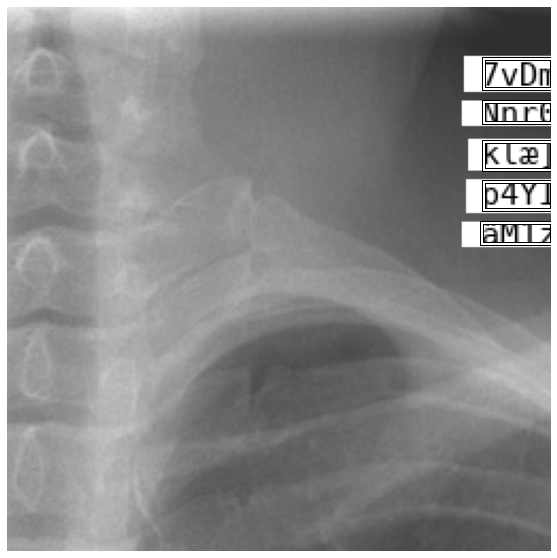

In [14]:
img.show(figsize=(10,10), y=bbox)

In [15]:
def get_y_func(o):
    name = o.split('/')[-1]
    ibb = img2bbox[name]
    bbox = ibb[0]
    labels = ibb[1]
    l=tuple([bbox, labels])
    return l

In [16]:
test_path_anno = Path('/home/fredrikmathisen/Documents/data/test/anno_dest/')

In [17]:
test_img_path = Path('/home/fredrikmathisen/Documents/data/test/')

In [18]:
input_xml_list_test = sorted(glob.glob(str(test_path_anno) + '/*.xml'))

In [19]:
filenames_test=[]
# bboxes=[]
# classes=[]
# lbl2bbox=[]
for files in range(len(input_xml_list_test)):
    names_test, bbox_test, cls_test = read_content(input_xml_list_test[files])
    filenames_test.append(names_test)
#     lbl2bbox.append(tuple((bbox,cls)))

In [20]:
test_series = pd.Series(filenames_test)

In [21]:
test_df=pd.DataFrame()

In [22]:
test_df['image_id']=test_series

In [23]:
test_df.head()

,image_id
0,000001.png
1,000002.png
2,000003.png
3,000004.png
4,000005.png


In [24]:
ts = (ObjectItemList.from_df(test_df,test_img_path, folder = 'img_dest' ,cols='image_id'))
image_id = test_df.image_id.values

In [25]:
def get_data(bs, size):
    src = ObjectItemList.from_df(img_df, img_path)
    src = src.split_by_rand_pct()
    src = src.label_from_func(get_y_func)
    src = src.transform(size=size)#, padding_mode='zeros', resize_method=ResizeMethod.SQUISH, tfm_y=True)
    src = src.add_test(ts)
    return src.databunch(path=img_path, bs=bs, collate_fn=bb_pad_collate)

In [26]:
data = get_data(45, 256)

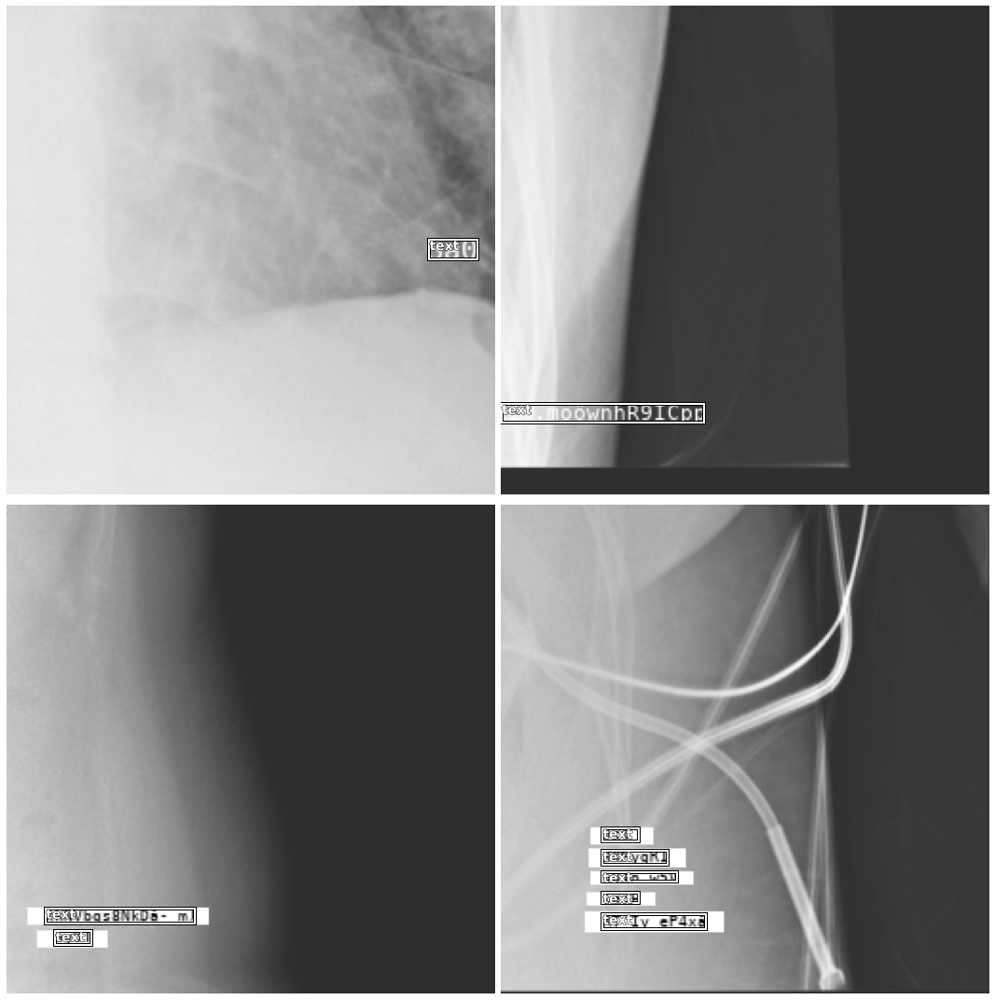

In [27]:
data.show_batch(rows=2, ds_type=DatasetType.Valid, figsize=(15,15))

In [28]:
ob = data.one_batch()

In [29]:
ob

(tensor([[[[0.4471, 0.4314, 0.4196,  ..., 0.7255, 0.7255, 0.7176],
           [0.4431, 0.4314, 0.4235,  ..., 0.7059, 0.7059, 0.7020],
           [0.4314, 0.4235, 0.4235,  ..., 0.7059, 0.7059, 0.7059],
           ...,
           [0.8667, 0.8627, 0.8588,  ..., 0.8941, 0.8941, 0.8941],
           [0.8745, 0.8588, 0.8588,  ..., 0.8941, 0.8902, 0.8902],
           [0.8784, 0.8627, 0.8706,  ..., 0.8980, 0.8863, 0.8863]],
 
          [[0.4471, 0.4314, 0.4196,  ..., 0.7255, 0.7255, 0.7176],
           [0.4431, 0.4314, 0.4235,  ..., 0.7059, 0.7059, 0.7020],
           [0.4314, 0.4235, 0.4235,  ..., 0.7059, 0.7059, 0.7059],
           ...,
           [0.8667, 0.8627, 0.8588,  ..., 0.8941, 0.8941, 0.8941],
           [0.8745, 0.8588, 0.8588,  ..., 0.8941, 0.8902, 0.8902],
           [0.8784, 0.8627, 0.8706,  ..., 0.8980, 0.8863, 0.8863]],
 
          [[0.4471, 0.4314, 0.4196,  ..., 0.7255, 0.7255, 0.7176],
           [0.4431, 0.4314, 0.4235,  ..., 0.7059, 0.7059, 0.7020],
           [0.4314, 0.42

In [30]:
data.classes

['background', 'text']

In [31]:
anchors = create_anchors(sizes=[(32,32),(16,16),(8,8),(4,4)], ratios=[0.05, 0.25, 0.4, 0.75], scales=[0.35, 0.5, 0.6,0.8, 1, 1.25, 1.6])

In [32]:
a=[0.05, 0.25, 0.4,0.75]
b=[0.35, 0.5, 0.6,0.8, 1, 1.25, 1.6]
print(len(a)*len(b))

28


In [33]:
len(anchors)

38080

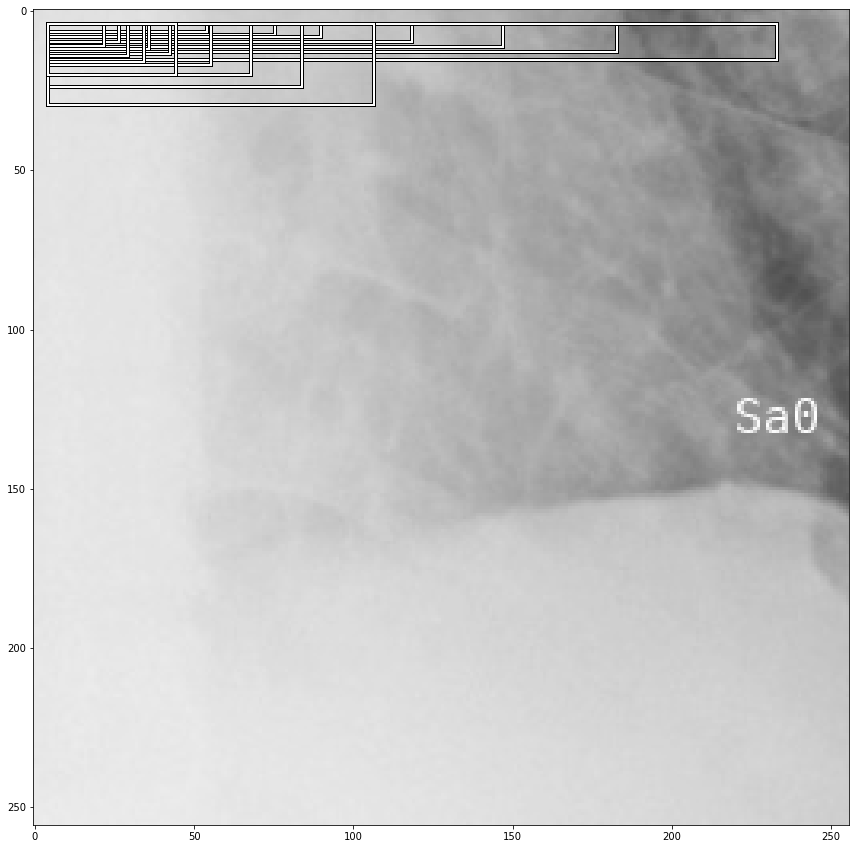

In [34]:
size=256
fig,ax = plt.subplots(figsize=(15,15))
ax.imshow(image2np(data.valid_ds[0][0].data))

for i, bbox in enumerate(anchors[:18]):
    bb = bbox.numpy()
    x = (bb[1] + 1) * size / 2 
    y = (bb[0] + 1) * size / 2 
    w = bb[3] * size / 2
    h = bb[2] * size / 2
    
    rect = [x,y,w,h]
    draw_rect(ax,rect)

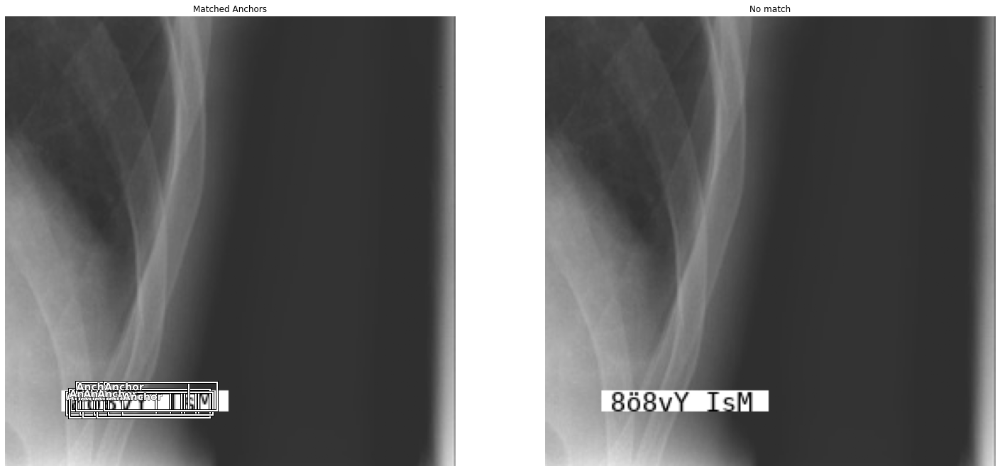

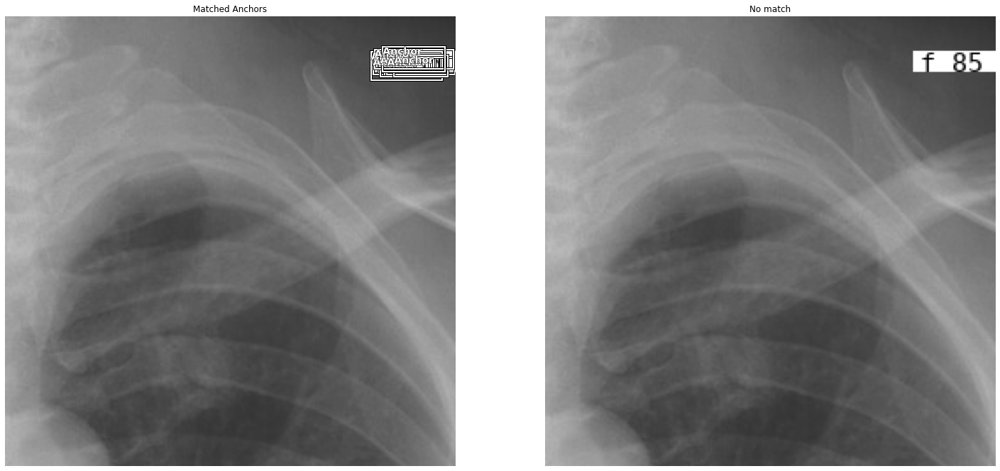

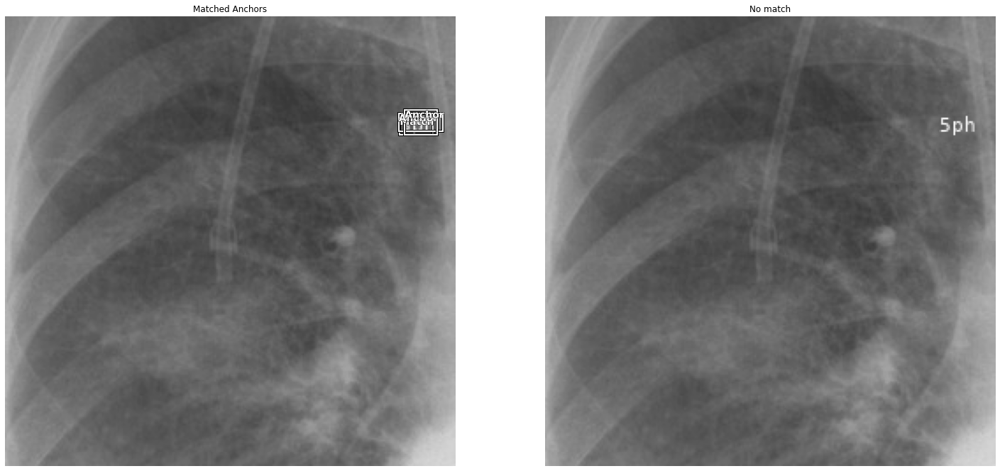

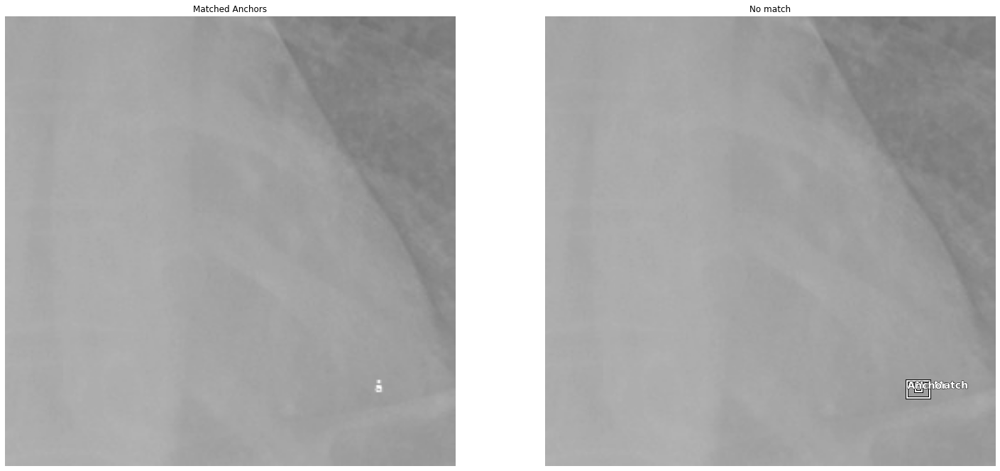

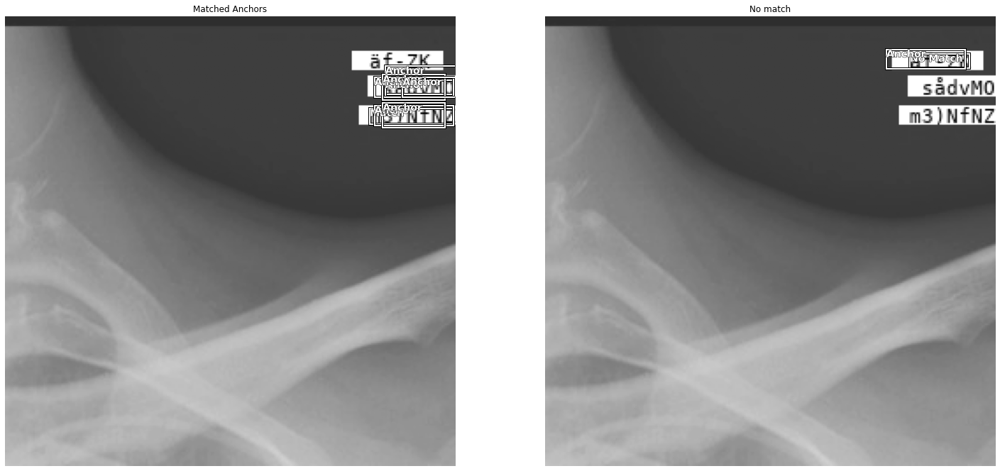

...

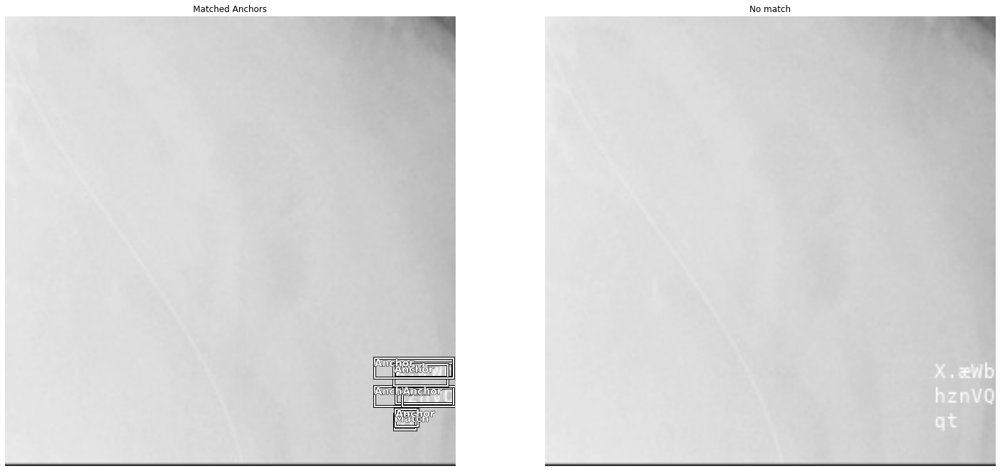

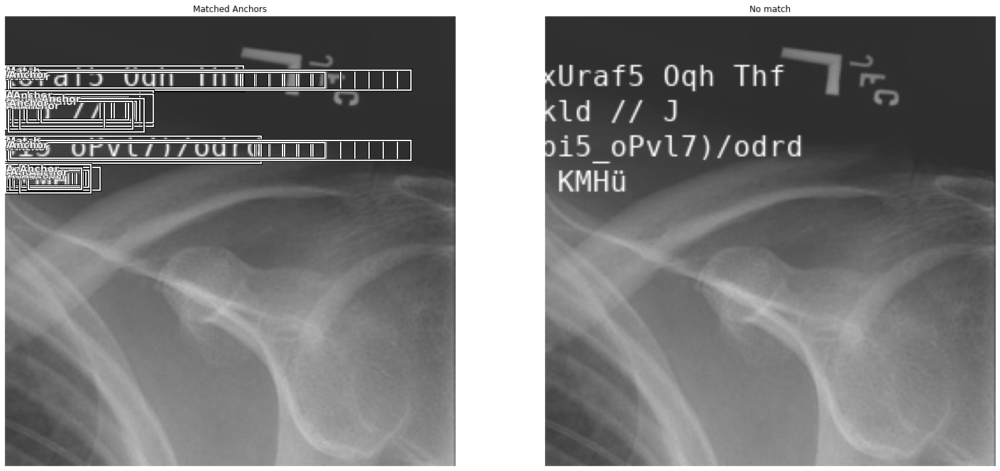

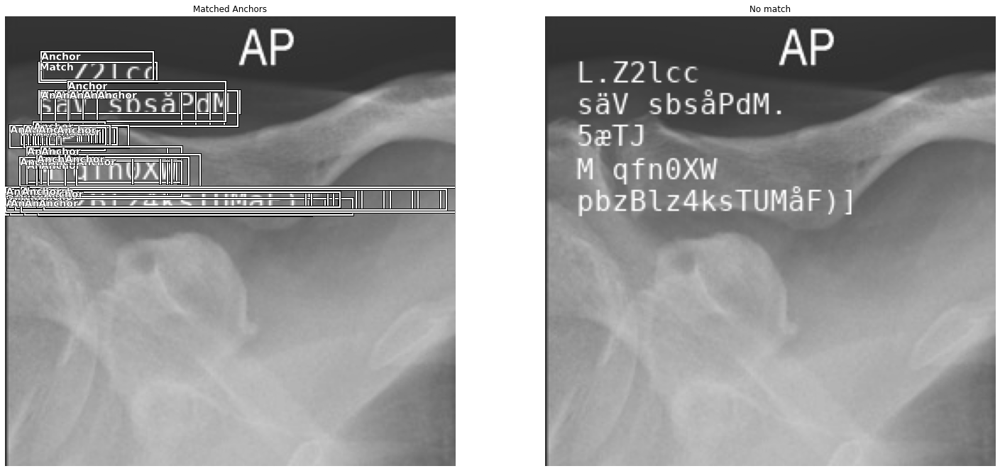

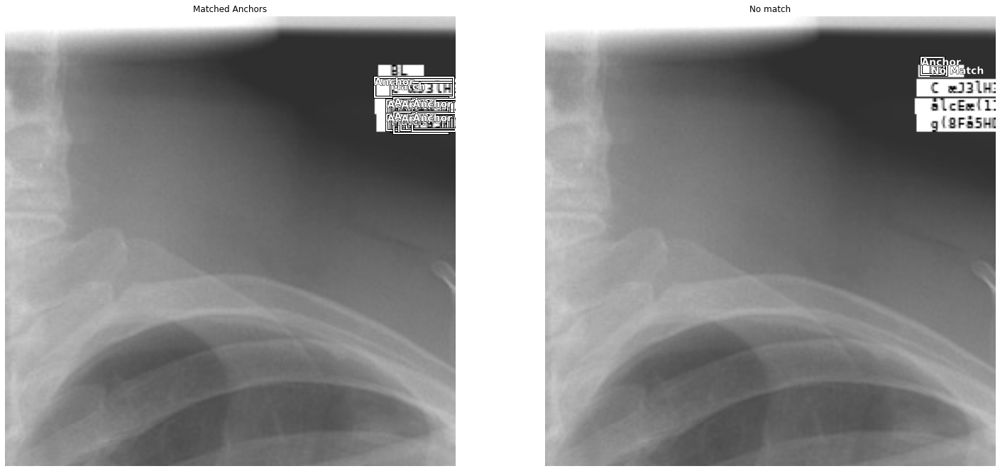

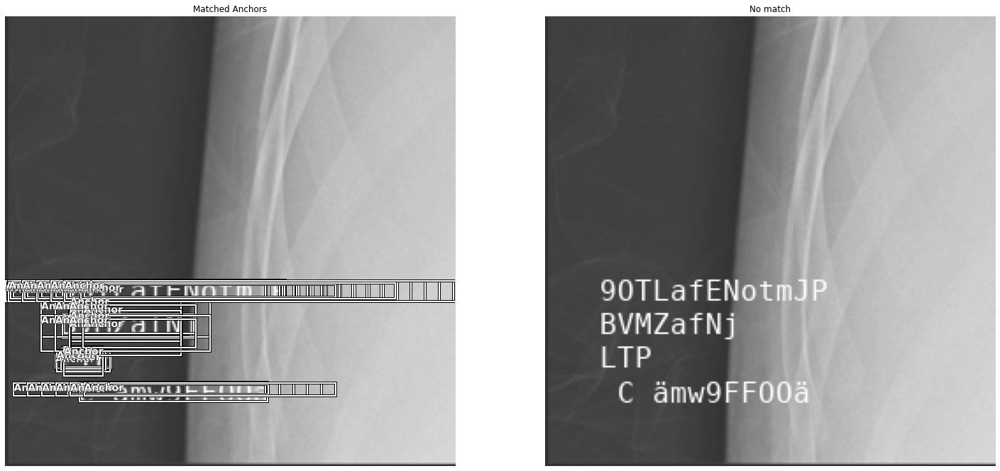

In [54]:
all_boxes, all_labels = show_anchors_on_images(data, anchors, figsize=(25,25))

In [35]:
n_classes=data.train_ds.c

crit=RetinaNetFocalLoss(anchors)

encoder = create_body(models.resnet50, True, -2)
model = RetinaNet(encoder, n_classes=data.train_ds.c, n_anchors=28,sizes=[32,16,8,4], chs=256, final_bias=-4., n_conv=2)

In [36]:
size = 256
voc = PascalVOCMetric(anchors, size, [i for i in data.train_ds.y.classes[1:]]) 
learn = Learner(data, model, loss_func=crit, callback_fns=[ShowGraph, BBMetrics], metrics=[voc])

In [37]:
learn.split([model.encoder[6], model.c5top5])
learn.freeze_to(-2)

epoch,train_loss,valid_loss,pascal_voc_metric,BBloss,focal_loss,AP-text,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 3.02E-03
Min loss divided by 10: 6.92E-05


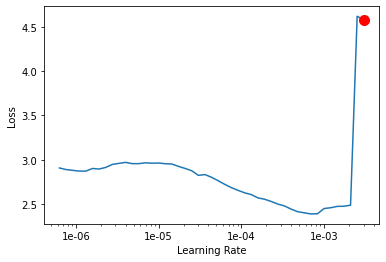

In [38]:
learn.lr_find()
learn.recorder.plot(suggestion=True)

epoch,train_loss,valid_loss,pascal_voc_metric,BBloss,focal_loss,AP-text,time
0,0.366368,0.330426,0.453591,0.127716,0.202710,0.453591,09:47
1,0.177123,0.182189,0.479808,0.076808,0.105382,0.479808,09:35
2,0.123085,0.141660,0.514236,0.059462,0.082199,0.514236,09:39
3,0.082097,0.114975,0.488536,0.051460,0.063515,0.488536,09:31
4,0.063102,0.114939,0.492555,0.050382,0.064557,0.492555,09:32


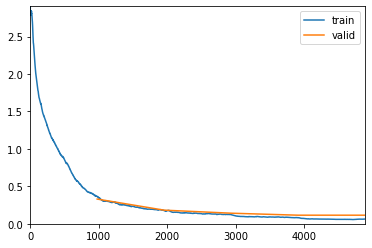

In [39]:
learn.fit_one_cycle(5, 1e-4)

In [40]:
learn.save('stage1-256')

In [41]:
learn.unfreeze()

epoch,train_loss,valid_loss,pascal_voc_metric,BBloss,focal_loss,AP-text,time
0,0.087708,0.133225,0.489299,0.059011,0.074214,0.489299,10:01
1,0.094790,0.119452,0.486030,0.052774,0.066678,0.486030,09:53
2,0.067397,0.102675,0.494157,0.046612,0.056063,0.494157,09:56
3,0.039220,0.097222,0.500398,0.042717,0.054505,0.500398,09:58
4,0.025130,0.098787,0.505463,0.041980,0.056807,0.505463,10:01


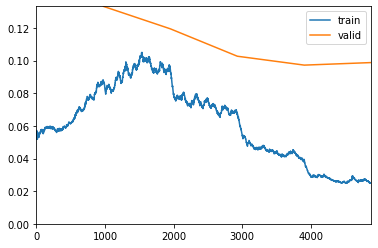

In [42]:
learn.fit_one_cycle(5, (1e-4))#slice(1e-4, 1e-3))

In [43]:
learn.save('stage2-256')

In [33]:
learn.load('stage2-256')

Learner(data=ImageDataBunch;

Train: LabelList (43984 items)
x: ObjectItemList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: ObjectCategoryList
ImageBBox (256, 256),ImageBBox (256, 256),ImageBBox (256, 256),ImageBBox (256, 256),ImageBBox (256, 256)
Path: /home/fredrikmathisen/Documents/data/1_class_voc/img_dest;

Valid: LabelList (10995 items)
x: ObjectItemList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: ObjectCategoryList
ImageBBox (256, 256),ImageBBox (256, 256),ImageBBox (256, 256),ImageBBox (256, 256),ImageBBox (256, 256)
Path: /home/fredrikmathisen/Documents/data/1_class_voc/img_dest;

Test: LabelList (5422 items)
x: ObjectItemList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: EmptyLabelList
,,,,
Path: /home/fredrikmathisen/Documents/data/1_class_voc/img_dest, model=RetinaNet(
  (encoder): Sequential(
    (0): 

In [68]:
learn.freeze_to(-2)

In [69]:
learn.lr_find()

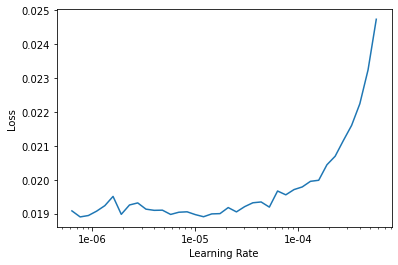

In [70]:
learn.recorder.plot()

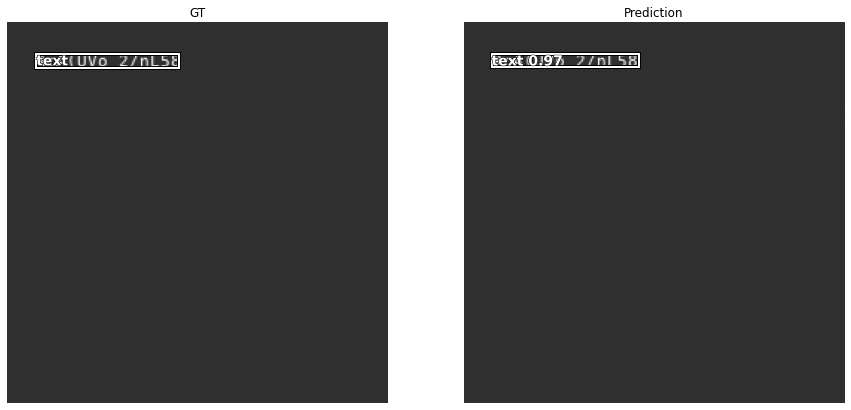

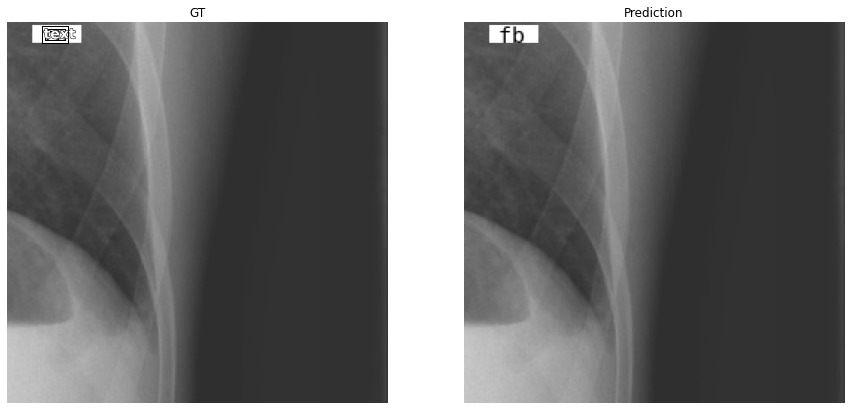

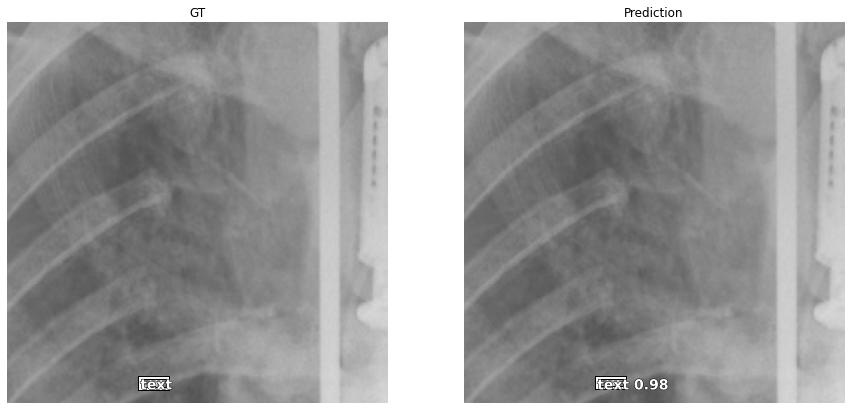

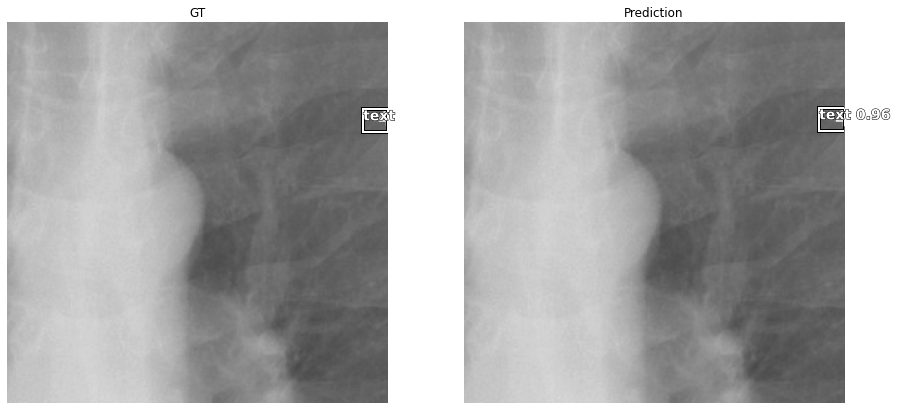

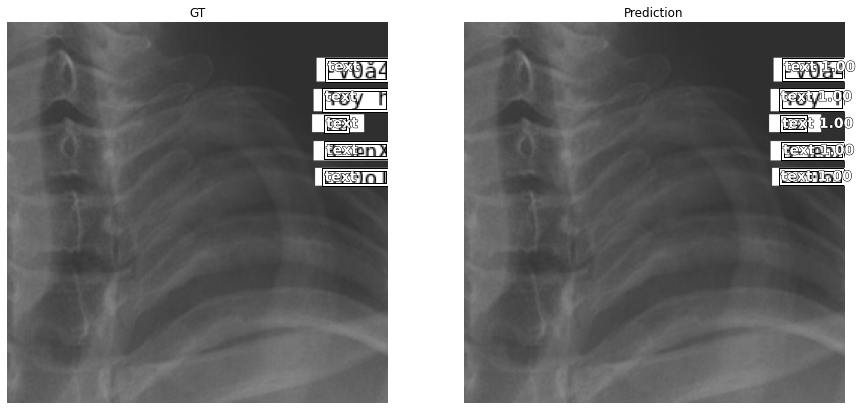

...

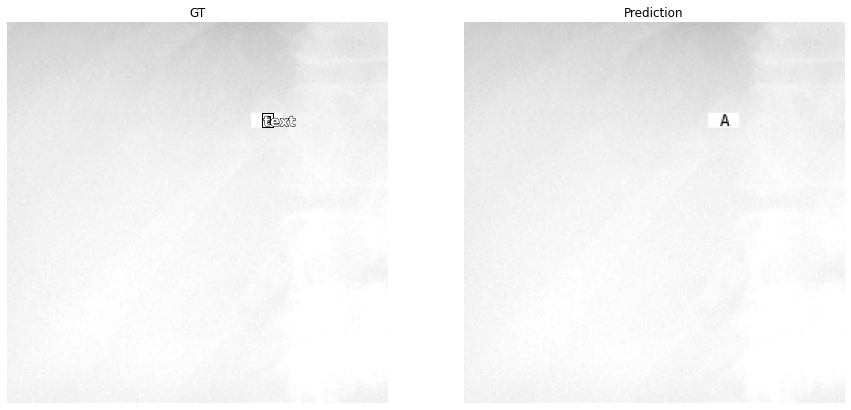

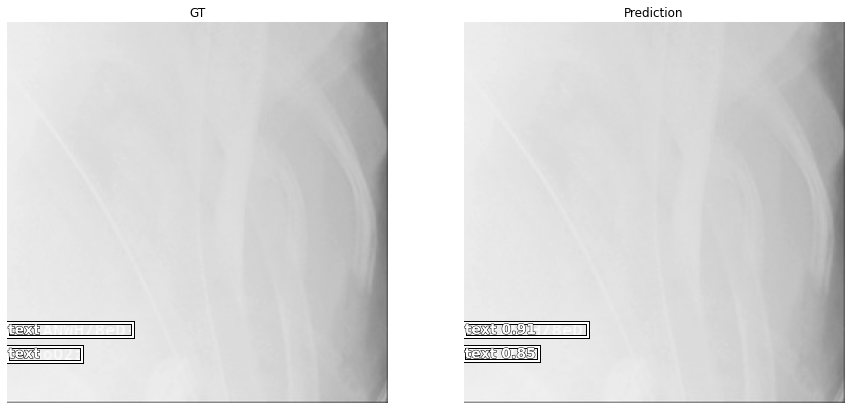

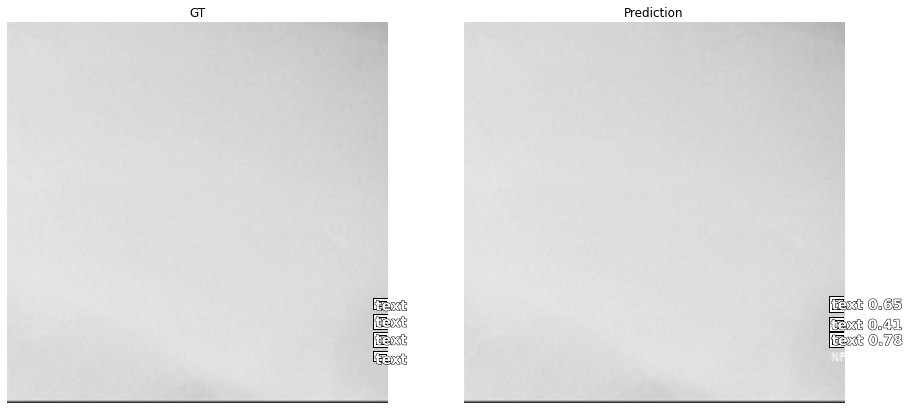

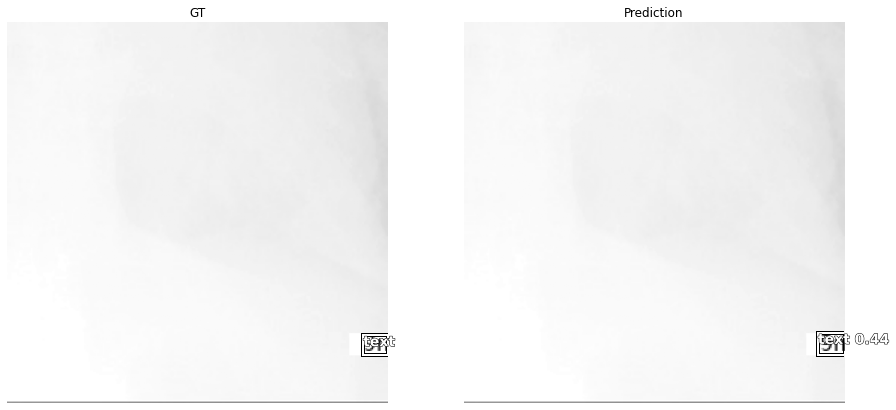

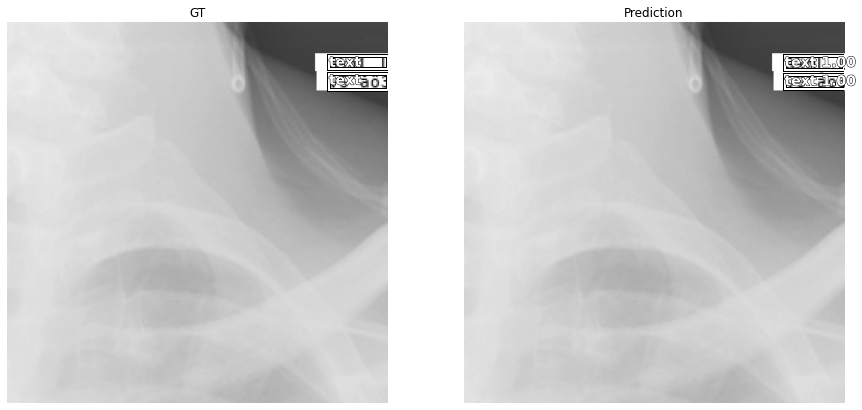

In [34]:
show_results_side_by_side(learn, anchors, detect_thresh=0.25, nms_thresh=0.1, image_count=50)

In [38]:
learn.load('stage2-256')

Learner(data=ImageDataBunch;

Train: LabelList (43984 items)
x: ObjectItemList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: ObjectCategoryList
ImageBBox (256, 256),ImageBBox (256, 256),ImageBBox (256, 256),ImageBBox (256, 256),ImageBBox (256, 256)
Path: /home/fredrikmathisen/Documents/data/1_class_voc/img_dest;

Valid: LabelList (10995 items)
x: ObjectItemList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: ObjectCategoryList
ImageBBox (256, 256),ImageBBox (256, 256),ImageBBox (256, 256),ImageBBox (256, 256),ImageBBox (256, 256)
Path: /home/fredrikmathisen/Documents/data/1_class_voc/img_dest;

Test: LabelList (548 items)
x: ObjectItemList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: EmptyLabelList
,,,,
Path: /home/fredrikmathisen/Documents/data/1_class_voc/img_dest, model=RetinaNet(
  (encoder): Sequential(
    (0): C

In [39]:
img,target = next(iter(data.train_dl))
with torch.no_grad():
    output = learn.model(img)

In [40]:
len(output)

3

In [125]:
output

[tensor([[[   -5.0888,   -10.1807],
          [   -5.1174,   -10.1808],
          [   -5.5598,   -10.1808],
          ...,
          [ -251.3085,  -251.3085],
          [ -251.3085,  -251.3085],
          [ -251.3085,  -251.3085]],
 
         [[   -6.4354,   -11.7986],
          [   -6.5692,   -11.7987],
          [   -6.5716,   -11.7987],
          ...,
          [  -34.2403,   -34.2403],
          [  -34.2403,   -34.2403],
          [  -34.2403,   -34.2403]],
 
         [[   -5.7562,   -11.4928],
          [   -5.6910,   -11.4928],
          [   -6.0365,   -11.4928],
          ...,
          [  -90.6622,   -90.6622],
          [  -90.6622,   -90.6622],
          [  -90.6622,   -90.6622]],
 
         ...,
 
         [[   -4.3643,   -10.1574],
          [   -4.4370,   -10.1575],
          [   -4.6784,   -10.1575],
          ...,
          [  -28.3842,   -28.3842],
          [  -28.3842,   -28.3842],
          [  -28.3842,   -28.3842]],
 
         [[   -6.5352,   -11.5193],
          [ 

In [41]:
img[-3].shape

torch.Size([3, 256, 256])

In [108]:
from torchvision import transforms
im = transforms.ToPILImage()(img[-3]).convert("RGB").cpu()

TypeError: can't convert cuda:1 device type tensor to numpy. Use Tensor.cpu() to copy the tensor to host memory first.

In [111]:
test=Image(img[-3])

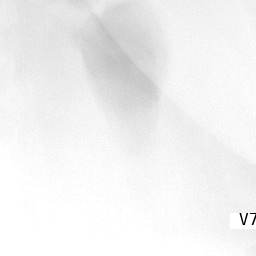

In [112]:
test

In [143]:
from PIL import Image

img = Image('/home/fredrikmathisen/Documents/data/predspicks/output/images/00000003_00002.png')

TypeError: 'module' object is not callable

In [140]:
type(img)

PIL.PngImagePlugin.PngImageFile

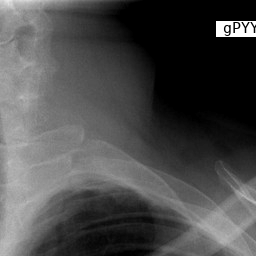

In [141]:
img

In [123]:
def show_output(item,bboxs_tot,scores_tot):
    fig,ax = plt.subplots(figsize=(10,10))
    ax.imshow(image2np(item.data))
    plt.axis('off')
    area_max = 256**2/5 
    for bbox, c in zip(bboxs_tot[0], scores_tot[0].numpy()):
        txt = 'text, {0:.4f}'.format(c)
        if bbox[2]*bbox[3] <= area_max:
            draw_rect(ax, [bbox[1],bbox[0],bbox[3],bbox[2]], text=txt,text_size=12,color='red')

In [135]:
def process_preds_show(item,clas,bboxs,show_img,cnt,i):
    detect_thresh=0.4   # set your own detection threshold
    nms_thresh=0.1
    pred_string = []
    scores_tot = []
    bboxs_tot = []
    show_img = True if i<cnt else False
    for clas_pred, bbox_pred in list(zip(clas, bboxs)):
        bbox_pred, scores, preds = process_output(clas_pred, bbox_pred, anchors, detect_thresh)
        if bbox_pred is not None:
            to_keep = nms(bbox_pred, scores, nms_thresh)
            bbox_pred, preds, scores = bbox_pred[to_keep].cpu(), preds[to_keep].cpu(), scores[to_keep].cpu()
        t_sz = torch.Tensor([size])[None].cpu()
        if bbox_pred is not None:
            bbox_pred = to_np(rescale_boxes(bbox_pred, t_sz))
                # change from center to top left
            bbox_pred[:, :2] = bbox_pred[:, :2] - bbox_pred[:, 2:] / 2
            bboxs_tot.append(bbox_pred)
            scores_tot.append(scores)
    if show_img:
        show_output(item,bboxs_tot,scores_tot)
    area_max = (256**2)/5
    #print(bboxs_tot[0])
    for s,bbx in zip(scores_tot[0].numpy(),bboxs_tot[0]):
        bbx = [int(round(x)) for x in bbx*2]
        if bbx[2]*bbx[3] <= area_max :
            res = "{0:.4f} {1} {2} {3} {4}".format(s,bbx[1],bbx[0],bbx[3],bbx[2])
            pred_string.append(res)
    return pred_string



In [150]:
def get_prediction(show_img=True,cnt=10): 
    # Set show img True to see img or else false for bboxs only, cnt for number of images to show
    preds_str = {}
    for i in range(len(data.test_ds)):
        item = learn.data.test_ds[i][0]  #Pick one image
        batch = learn.data.one_item(item)
        clas,bboxs,xtr = learn.pred_batch(batch=batch)
        #print(bboxs)
        prd = process_preds_show(item,clas,bboxs,show_img,cnt,i)     
        preds_str[image_id[i]] = " ".join(prd)
        print(prd)
        print(preds_str[image_id[i]])
    return preds_str

['0.9993 23 77 98 16', '0.9982 21 131 152 13', '0.8734 23 98 39 13', '0.7741 23 113 34 11']
0.9993 23 77 98 16 0.9982 21 131 152 13 0.8734 23 98 39 13 0.7741 23 113 34 11
['0.9993 433 113 71 14', '0.9575 430 79 82 16', '0.9162 429 61 82 15', '0.8368 433 93 77 14']
0.9993 433 113 71 14 0.9575 430 79 82 16 0.9162 429 61 82 15 0.8368 433 93 77 14
['1.0000 0 112 89 15', '0.9897 0 75 92 16']
1.0000 0 112 89 15 0.9897 0 75 92 16


IndexError: list index out of range

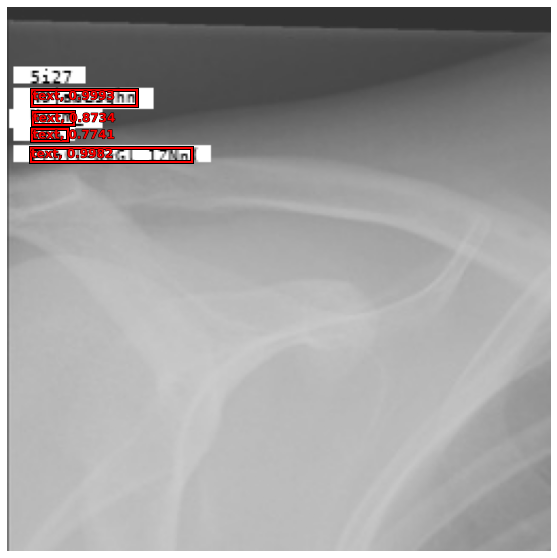

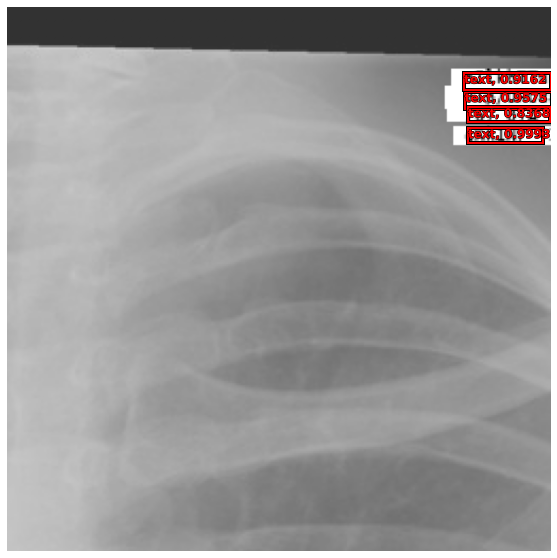

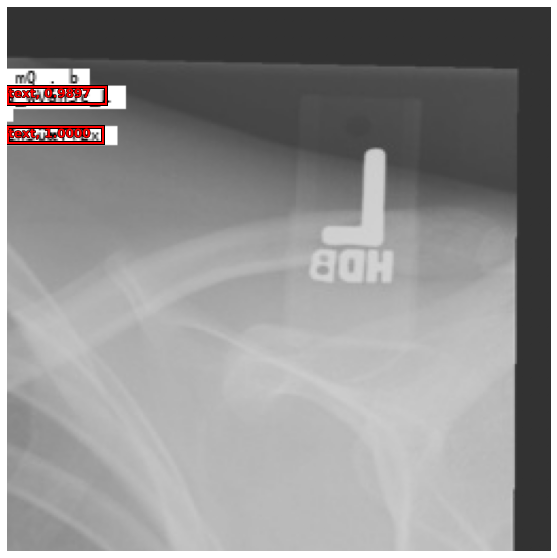

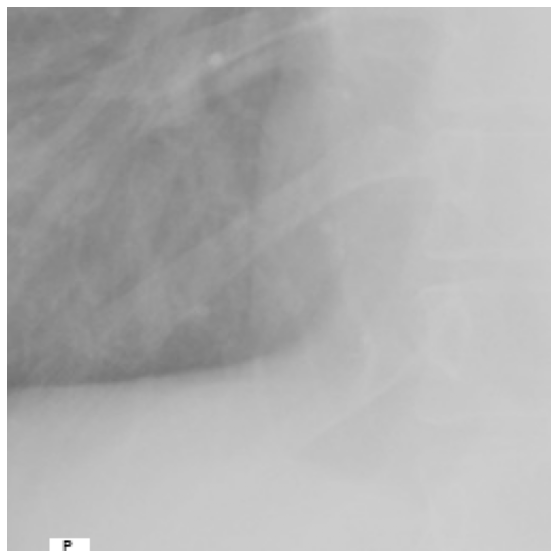

In [151]:
pred = get_prediction()

In [152]:
learn.pred_batch(batch=learn.data.one_item(learn.data.test_ds[0][0]))

[tensor([[[ -5.4336,  -8.4697],
          [ -5.1968,  -8.4697],
          [ -5.2633,  -8.4697],
          ...,
          [-50.6860, -58.9934],
          [-58.9934, -58.9934],
          [-58.9934, -58.9934]]]),
 tensor([[[ 0.0570,  0.2316,  0.1900, -0.6050],
          [ 0.0552,  0.0953,  0.2541, -0.5244],
          [-0.0441,  0.0618,  0.0915, -0.4965],
          ...,
          [ 0.7805,  0.6616, -2.7317, -0.0035],
          [ 0.0000,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  0.0000]]]),
 [[32, 32], [16, 16], [8, 8], [4, 4]]]

In [144]:
print(learn.data.test_ds)

LabelList (5422 items)
x: ObjectItemList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: EmptyLabelList
,,,,
Path: /home/fredrikmathisen/Documents/data/1_class_voc/img_dest


In [56]:
learn.model.eval()
xb,yb=next(iter(learn.data.valid_dl))
preds=learn.model(xb)

In [72]:
preds

[tensor([[[-4., -4.],
          [-4., -4.],
          [-4., -4.],
          ...,
          [-4., -4.],
          [-4., -4.],
          [-4., -4.]],
 
         [[-4., -4.],
          [-4., -4.],
          [-4., -4.],
          ...,
          [-4., -4.],
          [-4., -4.],
          [-4., -4.]],
 
         [[-4., -4.],
          [-4., -4.],
          [-4., -4.],
          ...,
          [-4., -4.],
          [-4., -4.],
          [-4., -4.]],
 
         ...,
 
         [[-4., -4.],
          [-4., -4.],
          [-4., -4.],
          ...,
          [-4., -4.],
          [-4., -4.],
          [-4., -4.]],
 
         [[-4., -4.],
          [-4., -4.],
          [-4., -4.],
          ...,
          [-4., -4.],
          [-4., -4.],
          [-4., -4.]],
 
         [[-4., -4.],
          [-4., -4.],
          [-4., -4.],
          ...,
          [-4., -4.],
          [-4., -4.],
          [-4., -4.]]], device='cuda:1', grad_fn=<CatBackward>),
 tensor([[[0., 0., 0., 0.],
          [0., 0

In [79]:
preds[0].shape

torch.Size([10, 24480, 2])

In [80]:
preds

[tensor([[[-4., -4.],
          [-4., -4.],
          [-4., -4.],
          ...,
          [-4., -4.],
          [-4., -4.],
          [-4., -4.]],
 
         [[-4., -4.],
          [-4., -4.],
          [-4., -4.],
          ...,
          [-4., -4.],
          [-4., -4.],
          [-4., -4.]],
 
         [[-4., -4.],
          [-4., -4.],
          [-4., -4.],
          ...,
          [-4., -4.],
          [-4., -4.],
          [-4., -4.]],
 
         ...,
 
         [[-4., -4.],
          [-4., -4.],
          [-4., -4.],
          ...,
          [-4., -4.],
          [-4., -4.],
          [-4., -4.]],
 
         [[-4., -4.],
          [-4., -4.],
          [-4., -4.],
          ...,
          [-4., -4.],
          [-4., -4.],
          [-4., -4.]],
 
         [[-4., -4.],
          [-4., -4.],
          [-4., -4.],
          ...,
          [-4., -4.],
          [-4., -4.],
          [-4., -4.]]], device='cuda:1', grad_fn=<CatBackward>),
 tensor([[[0., 0., 0., 0.],
          [0., 0

In [44]:
learn.model.eval()
xb,yb = next(iter(learn.data.valid_dl))
preds = learn.model(xb),
#preds[0].shape,preds[1].shape

In [48]:
def un_pad(boxes,labels):
    bb_keep = ((boxes[:,2] - boxes[:,0])>0).nonzero()[:,0]
    return boxes[bb_keep],labels[bb_keep]

def show_img(idx,img_size=256,thresh=0.1):
    t_bbox,t_clas = un_pad(yb[0][idx],yb[1][idx])
    p_cls_test = preds[1][idx][:,1:].max(dim=1)
    idx_clas = p_cls_test[0].sigmoid() > thresh
    p_f_clas = (p_cls_test[1] + 1) * (idx_clas).long()
    img = vision.Image(denormalize(xb[idx],*tensor(imagenet_stats)))
    img_box = ImageBBox.create(img_size,img_size,yb[0][idx].cpu(),labels=yb[1][idx],classes=data.classes,scale=False)


    p_final_bbox = act_to_bbox(preds[0][idx].cpu(),anchors)
    t_bbox = p_final_bbox.cuda().index_select(dim=0,index=idx_clas.nonzero().squeeze())
    test_clas = p_f_clas.index_select(dim=0,index=idx_clas.nonzero().squeeze())
    p_img_box = ImageBBox.create(img_size,img_size,t_bbox.cpu(),test_clas,classes=data.classes,scale=False)

    fig,axes = plt.subplots(1,3,figsize=(12,8))
    img.show(ax=axes[0],y=img_box,title='Ground Truth')
    img.show(ax=axes[1],y=p_img_box,title='Prediction')
    img.show(ax=axes[2],title='Original')

In [49]:
show_img(0, img_size=256, thresh=0.4)

IndexError: tuple index out of range

In [53]:
len(preds[0][0])

45